## Vera Milovanović 185/2017

# NAPOMENA:
U trećem zadatku je problematično učitavanje slike 'road_blur', jer počinje na r, što predstavlja naredbu za nešto što onemogućuje učitavanje slike. Pre nego što budete pokretali preimenujte sliku u folderu sekvence u 'put_zamucen'! 

In [1]:
from __future__ import print_function

%matplotlib inline
import imageio
import ipywidgets as widgets 
from ipywidgets import interact, interactive, fixed, interact_manual

from matplotlib import pyplot as plt

import numpy.matlib
import numpy as np

from scipy import ndimage
from scipy.fftpack import fft2, fftshift, ifftshift, ifft2
from skimage import img_as_float
from skimage.exposure import rescale_intensity

import time

# Zadatak 1
Ucitavanje i prikaz ulazne slike i njenog centriranog amplitudskog spektra. Proširivanje slike kao priprema za filtriranje, dobija se bolja rezolucija.

In [3]:
f = img_as_float(imageio.imread('.\sekvence\girl_ht.tif'))
[M,N] = f.shape
P = 2*M
Q = 2*N
f_paded = np.zeros((P,Q))
f_paded[0:M, 0:N] = f
F = fftshift(fft2(f_paded))

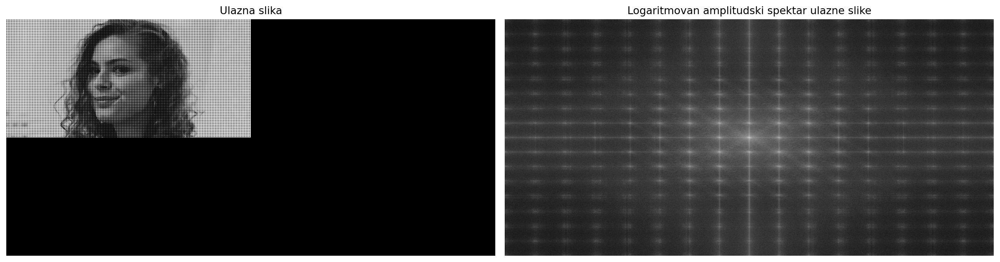

In [4]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(16,8), dpi=160)
ax = axes.ravel()
ax[0].imshow(f_paded, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(np.log(1+abs(F)),cmap='gray');   ax[1].set_axis_off(); 
ax[1].set_title('Logaritmovan amplitudski spektar ulazne slike');
plt.tight_layout()
plt.show()

Gledajući amplitudsku karakteristiku uočavamo da imamo dosta spektralnih komponenti na visokim učestanostima koje se u prostornom domenu vide kao prelazi sa tamnih kružića na svetlu pozadinu slike. One komponente koje su bliže dc vrednosti (komponenta u centru spektra) su tačkice na licu i kosi devojke sa slike, a tu je prelaz svetlo-tamno manjeg intenziteta. Zato je ideja da se uklone sve spekralne komponente sem dc vrednosti i neposredne okoline koja ne obuhvata šum, i koja nam nosi najviše informacija o slici (>95%).

In [5]:
def cnotch(filt_type, notch, M, N, C, r, n=1):
    """
    Ulazi:
        - filt_type: vrsta filtra, moguće opcije su:
                    - gaussian
                    - butterworth
                    - ideal
        - notch: tip filtra, moguće opcije su:
                - pass: filtar propusnik opsega
                - reject: filtar nepropusnik opsega
        - M: željena visina 2D filtra
        - N: željena širina 2D filtra
        - C: koordinate centara spektralnih kopoenti koje želimo da uklonimo
        - r: za filt_type = 'gaussian' ili 'butterworth' - standardna devijacija
                            'ideal' - poluprecnik filtra
        - n: red filtra, specificirati u slučaju da je izabran tip filtra butterworth
    Izlaz:
        filtar u frekvencijskom domenu
    """
    N_filters = len(C);
    filter_mask = np.zeros((M,N));

    # centriranje x i y koord
    if (M%2==0):
        y = np.arange(0,M) - M/2 + 0.5; 
    else:
        y = np.arange(0,M) - (M-1)/2;
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5; 
    else:
        x = np.arange(0,N) - (N-1)/2;
        
    # pravljenje noč filtra
    X,Y = np.meshgrid(x,y)
    
    for i in range(0,N_filters):
        C_current = C[i] 
        
        if (M%2==0):
            y0 = y - C_current[0] + M/2 - 0.5;
            
        else:
            y0 = y - C_current[0] + (M-1)/2;
            
        if (N%2 == 0):
            x0 = x - C_current[1] + N/2 - 0.5; 
            
        else:
            x0 = x - C_current[1] + (N-1)/2;
        
        x0c = -x0 + 2*x;
        y0c = -y0 + 2*y;
            
        X0,Y0 = np.meshgrid(x0,y0)    
        D0 = np.sqrt(np.square(X0) + np.square(Y0)); 
        
        
        X0c,Y0c = np.meshgrid(x0c,y0c)    
        D0c = np.sqrt(np.square(X0c) + np.square(Y0c)); 
        

        if filt_type == 'gaussian':
            filter_mask = filter_mask + \
                          np.exp(-np.square(D0)/(2*np.square(r[0]))) + \
                          np.exp(-np.square(D0c)/(2*np.square(r[0])))
        elif filt_type == 'butterworth':
            filter_mask = filter_mask + \
                          1/(1+(D0/r[0])**(2*n)) + \
                          1/(1+(D0c/r[0])**(2*n))
        elif filt_type == 'ideal':
            filter_mask[(D0<=r[0])|(D0c<=r[0])] = 1
        else:
            print('Greska! Nije podrzan tip filtra: ', filt_type)
            return
        
    
    if notch == 'pass':
        return filter_mask
    elif notch == 'reject':
        return 1 - filter_mask
    else:
        return 

In [6]:
def lpfilter(filt_type, M, N, sigma, n=1): 
    
    """
    Ulazi:
        - filt_type: vrsta filtra, moguće opcije su:
                    - gaussian
                    - butterworth
                    - ideal
                    - ellipse
        - M: željena visina 2D filtra
        - N: željena širina 2D filtra
        - sigma: standradna devijacija filtra po x i y osi
        - n: red filtra, specificirati u slučaju da je izabran tip filtra butterworth
    Izlaz:
        filtar u frekvencijskom domenu
    """
    
    if (M%2==0):
        y = np.arange(0,M) - M/2 + 0.5;
    else:
        y = np.arange(0,M) - (M-1)/2;
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5; 
    else:
        x = np.arange(0,N) - (N-1)/2;
    
    X,Y = np.meshgrid(x,y)
    
    # rastojanje od centra 
    D = np.sqrt(np.square(X) + np.square(Y)); 
    
    if filt_type == 'gaussian':
        filter_mask = np.exp(-np.square(D)/(2*np.square(sigma[0]))) 
    elif filt_type == 'butterworth':
        filter_mask = 1/(1+(D/sigma[0])**(2*n))
    elif filt_type == 'ideal':
        filter_mask = np.ones([M,N])
        filter_mask[D>sigma[0]] = 0
    elif filt_type == 'ellipse':
        D_ellipse =  np.sqrt(np.square(X)/sigma[0]**2 + np.square(Y)/sigma[1]**2);
        filter_mask = np.ones([M,N])
        filter_mask[D_ellipse>1] = 0
    else:
        print('Greska! Nije podrzan tip filtra: ', filt_type)
        return
    
    return filter_mask


In [9]:
%matplotlib widget
#%matplotlib inline
plt.figure()
plt.imshow(np.log(1+abs(F)), cmap = 'gray')
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Prva opcija je da napravimo noč filtar koji treba da ostrani sve nepoželje spektralne komponente. Pomoću widget alata možemo da zadamo nekoliko koordinata po x i y osi na osnovu kojih možemo da odredimo pravilnost u rastojanju spektralnih komponenti koje želimo da uklonimo. 

In [10]:
print(M,N)

1200 2480


In [7]:
y_peaks = np.array([2178,1876, 1574, 1271, 915, 614, 312])
x_peaks = np.array([1054, 908, 761, 615, 443])

diff_x = np.diff(x_peaks)
diff_y = np.diff(y_peaks)
distance_x = np.mean(abs(diff_x))
distance_y = np.mean(abs(diff_y))

y0s = np.arange(2, 5000, distance_y)
x0s = np.arange(5, 1100, distance_x)

c_x,c_y = np.meshgrid(x0s, y0s)

points = np.array(list(zip(np.concatenate(c_x), np.concatenate(c_y)))).tolist()
points_noise = points + [[P/2,2178], [P/2,1876], [P/2,1574], [P/2,1271], [P/2,915], [P/2,614], [P/2,312] ]

In [8]:
H = cnotch('ideal', 'reject', P, Q, points_noise, [70])
# filtriranje u rekvencijskom domenu
G = F*H

# inverzna fft, vraćanje u prostorni domen
g = np.real(ifft2(ifftshift(G)))
g = g[0:M, 0:N]
g[g<0] = 0
g[g>1] = 1

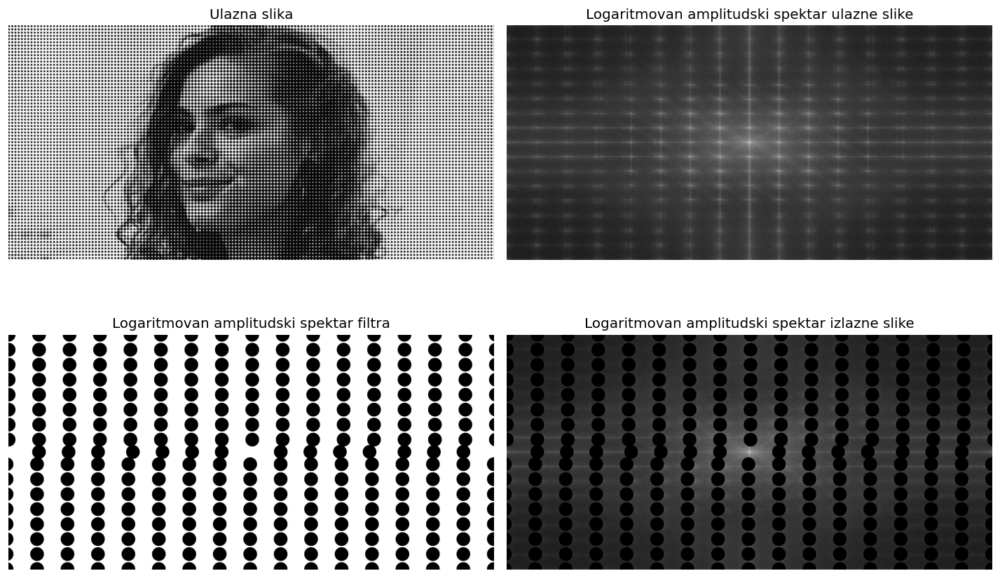

In [9]:
%matplotlib inline

fig,axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8), dpi=120) 
ax = axes.ravel()

ax[0].imshow(f,cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(np.log(1+abs(F)),cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Logaritmovan amplitudski spektar ulazne slike')
ax[2].imshow(np.log(1+abs(H)),cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Logaritmovan amplitudski spektar filtra')
ax[3].imshow(np.log(1+abs(G)),cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Logaritmovan amplitudski spektar izlazne slike')

plt.tight_layout()
plt.show()


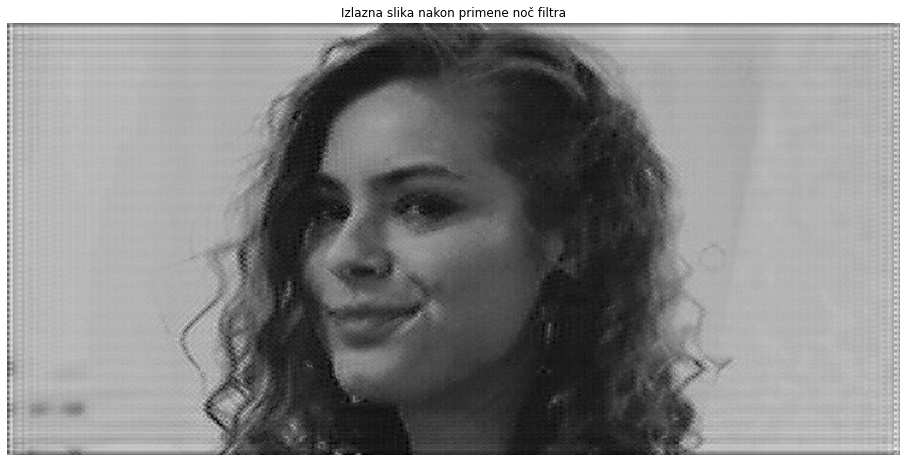

In [10]:
fig, ax = plt.subplots(figsize=(16,16))
ax.set_title('Izlazna slika nakon primene noč filtra')
plt.axis('off')
plt.imshow(g, vmin = 0, vmax = 1, cmap = 'gray')
plt.show()

FItriranje ovolikog broja spektralnih komponenti podugo traje, a rezultat nije naročito dobar jer se i dalje vidi šum. Druga opcija je da se što veći deo spektra oko dc komponente zadrži, a ostatak potisne niskofrekventnim filtrom u obliku elipse jer su prve komponente šuma na različitim udaljenostima od dc komponente.

In [11]:
Hlp_e = lpfilter('ellipse',P,Q,[230,120]) 

In [12]:
G_e = F*Hlp_e

g_e = np.real(ifft2(ifftshift(G_e)))
g_e = g_e[0:M, 0:N]
g_e[g_e<0] = 0
g_e[g_e>1] = 1


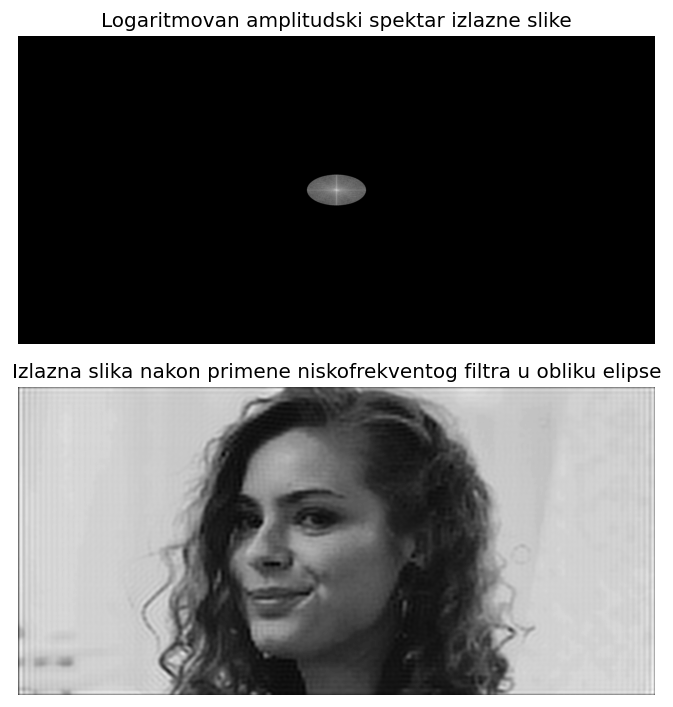

In [13]:
%matplotlib inline

fig,axes = plt.subplots(nrows=2, ncols=1, figsize=(6,6), dpi=120) 
ax = axes.ravel()

ax[0].imshow(np.log(1+abs(G_e)), cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Logaritmovan amplitudski spektar izlazne slike')
ax[1].imshow(g_e, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Izlazna slika nakon primene niskofrekventog filtra u obliku elipse')

plt.tight_layout()
plt.show()

U odnosu na rezultat dobijen primentom noč filtara vidimo da je slika zamućenija, a šum je i dalje prisutan. Prednost je u tome što je izvršavanje dosta brže. Zato je sledeći korak neka vrsta kombinacije prethodna dva pristupa, gde ćemo niskofrekventim filtrom pokušati da zadržimo što veći deo spektra oko dc vrednosti, a noč filtrom uklonimo par komponenti šuma koji će se naći po vertikali.

In [14]:
points_noise_1_notch = [[1054, 2479]]
H_notch = cnotch('ideal','reject', P, Q, points_noise_1_notch, [65])
H_lp = lpfilter('ideal', P, Q, [230])
H_lp_notch = H_notch*H_lp
G_n_lp = F*H_lp_notch

g_n_lp = np.real(ifft2(ifftshift(G_n_lp)))
g_n_lp = g_n_lp[0:M, 0:N]
g_n_lp[g_n_lp<0] = 0
g_n_lp[g_n_lp>1] = 1

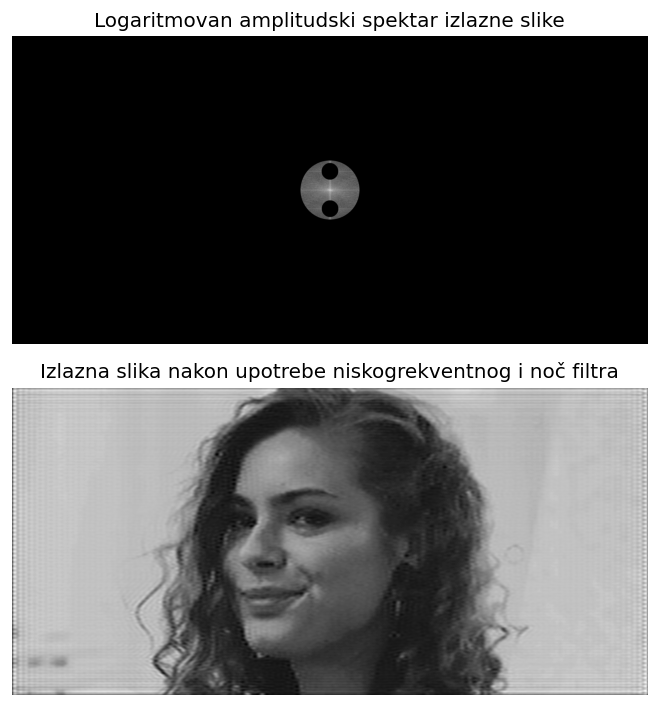

In [15]:
%matplotlib inline

fig,axes = plt.subplots(nrows=2, ncols=1, figsize=(6,6), dpi=120) 
ax = axes.ravel()

ax[0].imshow(np.log(1+abs(G_n_lp)),cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Logaritmovan amplitudski spektar izlazne slike')
ax[1].imshow(g_n_lp, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Izlazna slika nakon upotrebe niskogrekventnog i noč filtra')
plt.tight_layout()
plt.show()

Upoređivanjem više postupaka došla sam do toga da najbolje rezultate daje kombinacija idealnog noč filtra nepropusnika opsega i idealnog niskofrekvetnog filtra, jer je odnos kvalitet-složenost izvršavanja najbolji. Međutim, kontrast slike je veoma loš, pa možemo pokušati ga popravimo razvlačenjem histograma.

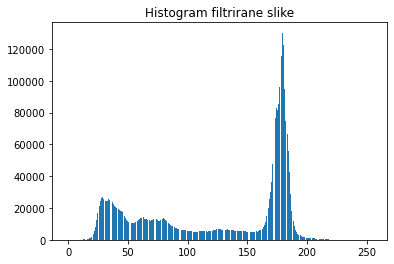

In [16]:
fig,ax = plt.subplots() 

hist_g_n_lp, bin_edges = np.histogram(g_n_lp.flatten()*255, bins=256, range=(0, 255))
plt.bar(bin_edges[0:-1], hist_g_n_lp)
ax.set_title('Histogram filtrirane slike')
plt.show()

In [17]:
def razvlacenje_histograma(f, in_min=0, in_max=255):
    """
    Pomoćna funkcija koja služi da bi se preko interact widget ustanovili pragovi intenziteta piksela koji daju
    najbolju popravku kontrasta.
    
    Ulazi:
        -f: slika nad kojom vršimo popravku kontrasta
        -in_min: donji prag piksela za razvlačenje
        -in_max: gornji prag piksela za razvlačenje
    """
    
    g = rescale_intensity(f, in_range=(in_min, in_max), out_range=(0,255))
    
    hist, bin_edges = np.histogram(g.flatten(), bins=256, range=(0,255))
    
    fig, ax = plt.subplots(ncols=2, figsize=(24,8), dpi=80)
    plt.tight_layout()
    
    ax[0].imshow(g, cmap='gray'); ax[0].set_title('Izlazna slika'); ax[0].axis('off')
    ax[1].bar(bin_edges[0:-1], hist); ax[1].set_title('Historam izlazne slike')
    
    plt.show()
    
    return

In [18]:
#interact(razvlacenje_histograma, f=fixed(g_n_lp*255))

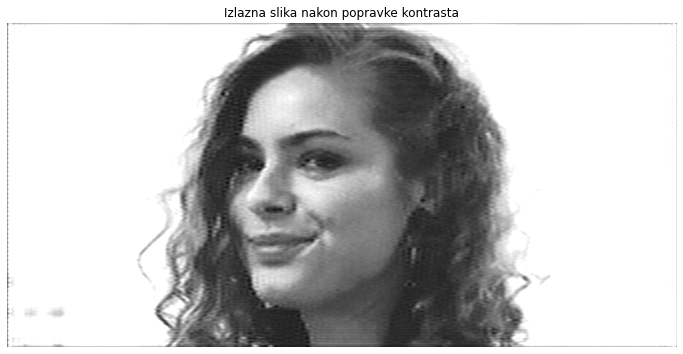

In [19]:
final = rescale_intensity(g_n_lp*255, in_range=(0, 160), out_range=(0,255))
fig, ax = plt.subplots(figsize=(12,12))
ax.set_title('Izlazna slika nakon popravke kontrasta')
plt.axis('off')
plt.imshow(final, vmin = 0, vmax = 255, cmap = 'gray')
plt.show()

**Zaključak**: Najbolji rezultati su dobijeni kompinacijom niskofrekvetnog i noč filtra, zajedno sa poravkom kontrasta. Nakon popravke kontrasta uspeli smo da dobijemo belu pozadinu, koja je bila na origialu, i lice je dosta izraženije.

# Zadatak 2

Učitavanje i prikaz ulazne slike.

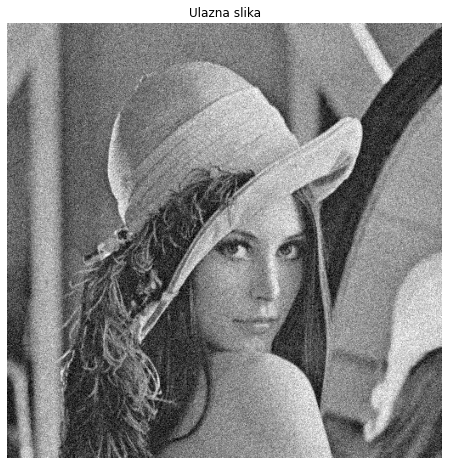

In [20]:
input_image = img_as_float(imageio.imread('.\sekvence\lena_noise.tif'))

fig, ax = plt.subplots(figsize=(8,8))
ax.set_title('Ulazna slika')
plt.axis('off')
plt.imshow(input_image, vmin = 0, vmax = 1, cmap = 'gray')
plt.show()

**Ideja rešenja**: U postavci zadatka je rečeno da možemo smatrati da većina piksela pripada uniformnim delovima slike, što znači da ukoliko na slici ne bismo imali šum lokalna varijansa piksela u okviru uniformnog dela slike bi bila bliska nuli. Sam histogram slike bi pod ovom pretpostavkom imao pikove na određenim intenzitetima osvetljaja (uniformnih površina), pa kad se od vrednosti piksela oduzme srednja vrednost intenziteta u okviru lokalnog susedstva (koja bi bila bliska vrednosti posmatranog piksela) i to digne na kvadrat dobija se vrednost bliska nuli. Matematičko očekivanje od konstante je ta konstanta, što predsavlja varijansu. Ukoliko je slika pogođena šumom koji ima slučajnu prirodu (u našem slučaju je to Gausov šum) mogli bismo da estimiramo njegovu varijansu analiziranjem histograma varijansi lokalog susedstva piksela zašumljene slike. Na prethodno pomenutom histogramu očekujemo da uočimo nagomilavanje varijansi (pik) oko određene vrednosti koja bi predstavljala **verodostojnu procenu varijanse šuma**. Ovo važi samo pod pretpostavkom da je odabrano lokalno susedstvo dovoljno malo tako da pikseli koje obuhvata pripadaju uniformnoj površini, ali i dovoljno veliko da bi procena bila pouzdana, gledano iz ugla broja odbiraka koje koristimo za procenu.

In [21]:
def estimate_local_variance(input_image, r):
    """
    Ulazi:
        - input_image: ulazna slika
        - r: poluobim lokalnog susedstva piksela
    Izlaz:
        matrica lokalnih varijansi piksela u okviru lokalnog susedstva za svaki piksel ulazne slike
    """
    window_seize = 2*r+1
    filter_mask_norm = np.ones([window_seize,window_seize])/(window_seize**2); 
    image_avg = ndimage.correlate(input_image,filter_mask_norm);
    image_sqr_avg = ndimage.correlate(input_image**2,filter_mask_norm)

    image_var = image_sqr_avg - image_avg**2;
    
    return image_var

Pri estimaciji parametra metodom histograma kritično je odabrati broj binova koji će odrediti opsege varijansi za koje se prebrojava broj varijansi lokalnog susedstva piksela slike koji upadaju svaki opseg. Taj broj binova ne sme da bude previše veliki kako ne bi došla do izražaja slučajna priroda raspodele varijanse, ali ni previše mali, kako ne bismo imali prevelike opsege varijansi, pa bismo efektivno previše usrednjili vrednosti varijansi - varijansa greške procene bi bila velika. Menjanjem broja binova ustavnovljeno je da se najreprezentativniji rezultati dobiju za 50 binova, jer se uočava nagomilavanje i očekivana promena oblika histograma kada se menja radijus lokalnog susedstva. 

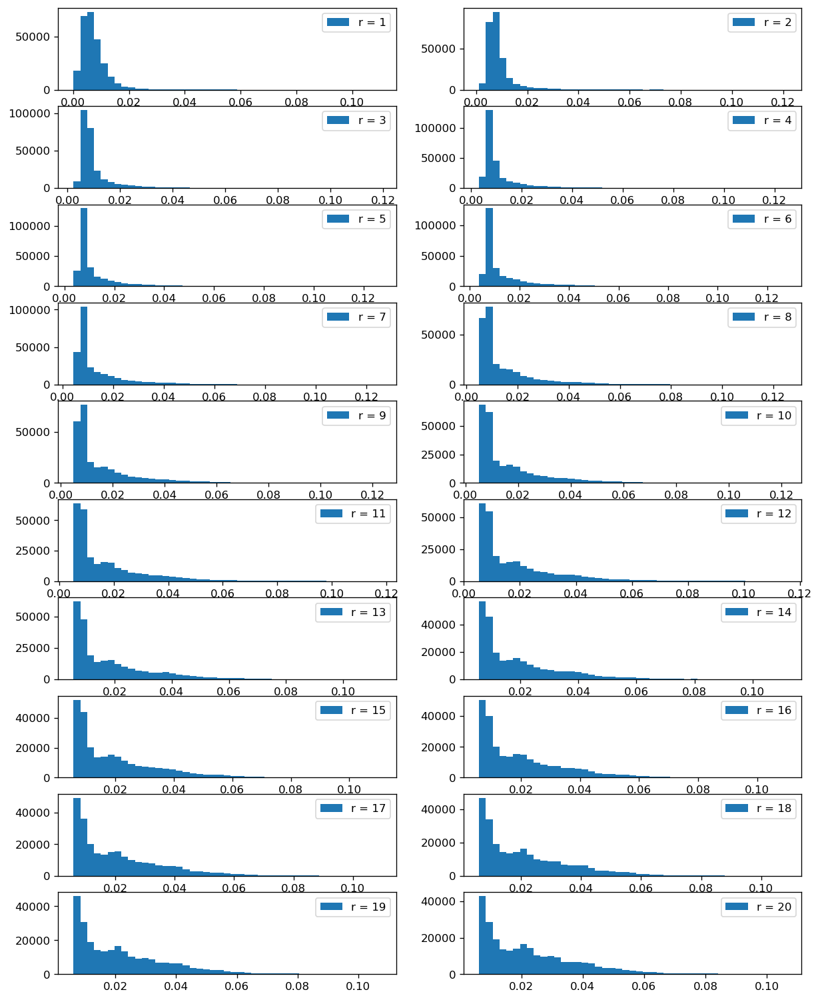

In [22]:
num_hist_bins = 45 # broj stubića (binova) za dobijanje histograma
radius_values = list(range(1,21))
"""
local_variances_per_bin: U svakoj vrsti promenljive će biti broj varijansi lokalnog susedstva koje su upale u stubić koji 
obuhvata određeni raspon vrednosti lok.varijansi. Ti opsezi su iste širine u celom histogramu, a njihov broj je određen
brojem koji smo upisali u promenjivu num_hist_bins. Vrsta ima onoliko koliko i vrednosti za radijus lokalnog susedstva.
"""
local_variances_per_bin = np.zeros([len(radius_values), num_hist_bins]) 
"""
bins_edges: granice opsega varijansi lokalnog susedstva svakog piksela ulazne slike
"""
bins_edges = np.zeros([len(radius_values), num_hist_bins + 1]) 

fig,axes = plt.subplots(nrows=10, ncols=2, figsize=(12,16), dpi=120) 
ax = axes.ravel()

for i in radius_values:
    local_img_var = estimate_local_variance(input_image, i)        
    local_variances_per_bin[i-1],bins_edges[i-1],_ = ax[i-1].hist(local_img_var.flatten(), density = False, \
                                                            bins = num_hist_bins)
    ax[i-1].legend(['r = ' + str(i)])

plt.show()

    

Sada treba za svaku vrednost radijusa odrediti koja je to varijansa najučestalija, tj. vrednost na x osi histograma ispod najvećeg pika. Ta vrednost predstavlja estimaciju varijanse šuma i odredićemo je kao sredinu između ivica opsega varijansi gde je upalo naviše vrednosti varijansi lokalnog susedstva piksela ulazne slike. 

In [23]:
noise_var_hist_max_per_radius = np.max(local_variances_per_bin,axis=1) # vrednosti najučestalijih varijansi za svaku
# vresnost radijusa (i)
indexes_of_max_hist_values = np.zeros([len(radius_values),1])
noise_var_per_radius = np.zeros([len(radius_values),1])
for i in range(0, len(radius_values)):
    # određivanje indeksa elementa(kolone) koji predstavlja najučestaliju varijansu u vrsti za odgovarajuću vrednost 
    # radijusa(i)
    indexes_of_max_hist_values[i,:] = np.where(local_variances_per_bin[i,:] == noise_var_hist_max_per_radius[i])
    # varijansa ispod najvišeg pika
    noise_var_per_radius[i,:] = bins_edges[i,int(indexes_of_max_hist_values[i]+1)]

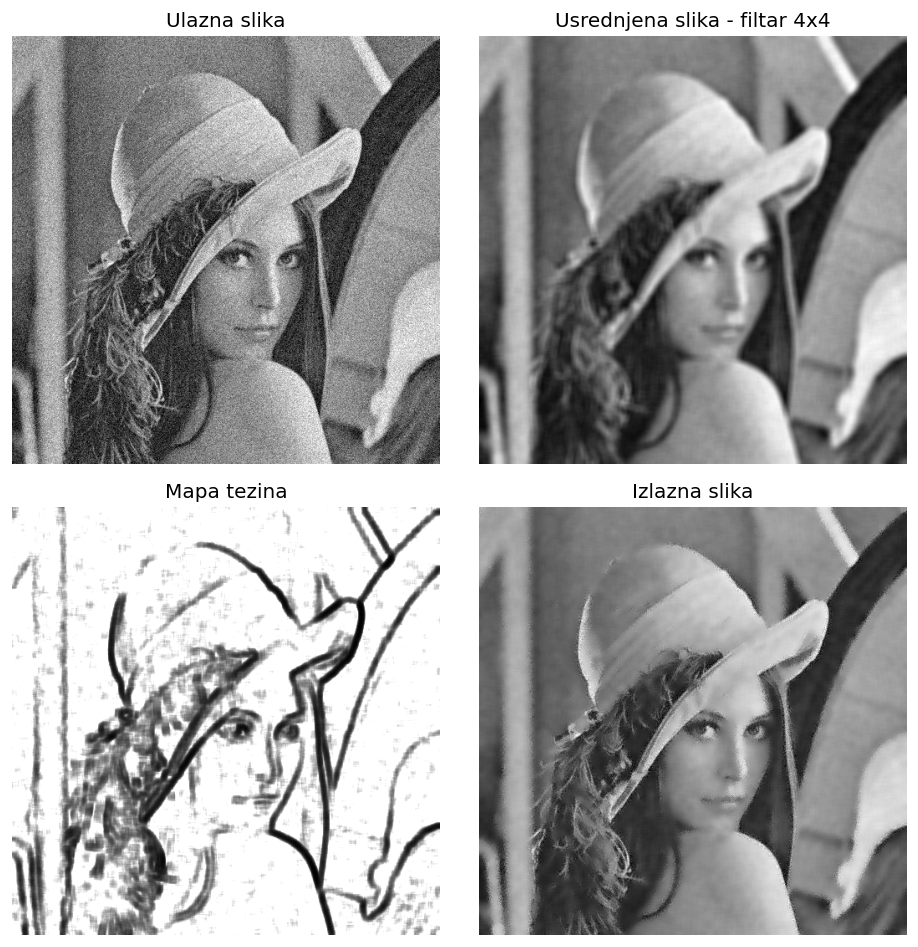

In [24]:
r = 4
window_seize = 2*r+1
filter_mask_norm = np.ones([window_seize,window_seize])/(window_seize**2)
image_avg = ndimage.correlate(input_image,filter_mask_norm)
image_sqr_avg = ndimage.correlate(input_image**2,filter_mask_norm)
image_var = image_sqr_avg - image_avg**2
noise_var = noise_var_per_radius[r-1]
w = noise_var/image_var
w[w>1] = 1

input_image_est = input_image + w*(image_avg - input_image) 

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize=(8,8), dpi=120)
ax = axes.ravel()

ax[0].imshow(input_image, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(image_avg, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Usrednjena slika - filtar ' + \
                                                                            str(r) + 'x' + str(r))
ax[2].imshow(w, cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Mapa tezina')
ax[3].imshow(input_image_est,cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Izlazna slika')

plt.tight_layout()
plt.show()

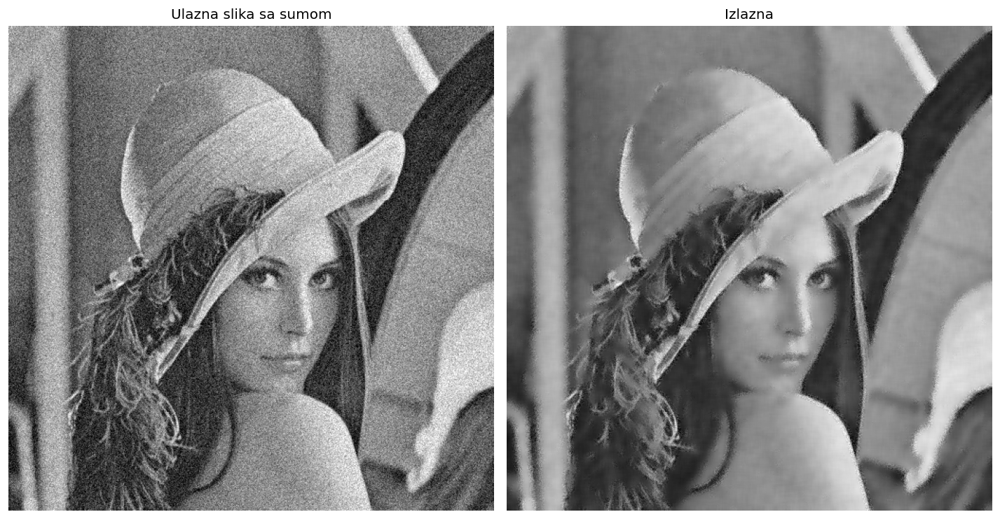

In [25]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,8), dpi=120)
ax = axes.ravel()

ax[0].imshow(input_image,cmap='gray');  ax[0].set_axis_off(); ax[0].set_title('Ulazna slika sa sumom')
ax[1].imshow(input_image_est,cmap='gray');  ax[1].set_axis_off(); ax[1].set_title('Izlazna')


plt.tight_layout()
plt.show()

In [26]:
print('Estimirana varijansa šuma' + str(noise_var))

Estimirana varijansa šuma[0.00861082]


**Zaključak**: Predloženom metodom procene varijanse šuma ona nije skroz tačno estimirana, jer možemo videti da mapa težina propušta na nekim mestima šum, ali ivice su dosta dobro detektovane. Na izlazu smo dobili ono što smo očekivali - oko ivica je maska težina bliska 0 (crna boja) i na tim mesima uzimamo piksele zašumljene slike jer ne želimo da ih usrednjimo sa okolinom, međutim tu možemo videti i da je propušteno malo šuma jer ivice nisu idealno tanke na maši težina. Na uniformnim površinama su nam bitniji pikseli koji su nastali propuštanjem zašumljene slike kroz filtar koji radi lokalno usrednjavanje i na taj način smo potisnuli šum. 

# Zadatak 3

Učitavanje i prikaz ulazne slike i njenog amplitudskog spektra.

In [27]:
g = img_as_float(imageio.imread('.\sekvence\put_zamucen.png'))
M = g.shape[0]
N = g.shape[1]
G = fftshift(fft2(g[:, :, 0]))

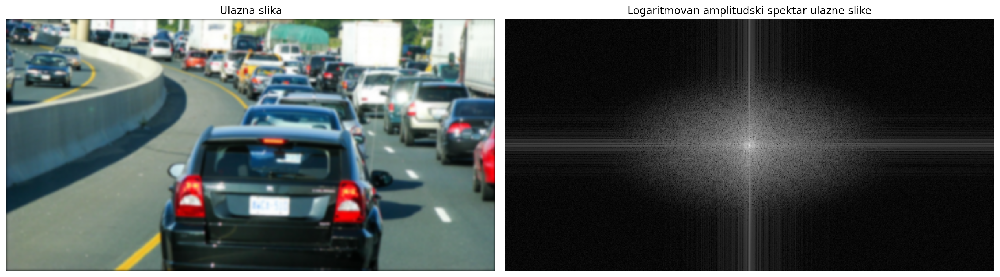

In [28]:
%matplotlib inline
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(16,8), dpi=160)
ax = axes.ravel()
ax[0].imshow(g); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(np.log(1+abs(G)),cmap='gray'); ax[1].set_axis_off(); 
ax[1].set_title('Logaritmovan amplitudski spektar ulazne slike');
plt.tight_layout()
plt.show()

U tekstu zadatka je rečeno da se raspiranje svetlosti može opisati Gausovom funkcijom nepoznate standradne devijacije, koja predstavlja degradacionu funkciju koju ćemo pokušati da estimiramo. Analizirajući spektar možemo da pretpostavimo da je degradaciona funkcija puna bela elipsa, odnosno da Gausova funkcija nema iste standardne devijacije po obe ose.

In [29]:
def anisotropic_gaussian(M, N, D0_x, D0_y):
    if (M%2==0):
        y = np.arange(0,M) - M/2 + 0.5;
    else:
        y = np.arange(0,M) - (M-1)/2;
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5; 
    else:
        x = np.arange(0,N) - (N-1)/2;
    
    X,Y = np.meshgrid(x,y)
    X, Y = np.meshgrid(x, y)
    
    return np.exp(-0.5*((X/D0_x)**2 + (Y/D0_y)**2))

In [30]:
# standardne devijacije koje su dale najbolji rezultat
D0_x = 65
D0_y = 35

H = anisotropic_gaussian(M, N, D0_x, D0_y)
H_lp_cut_off = lpfilter('ellipse',M,N,[190,100])

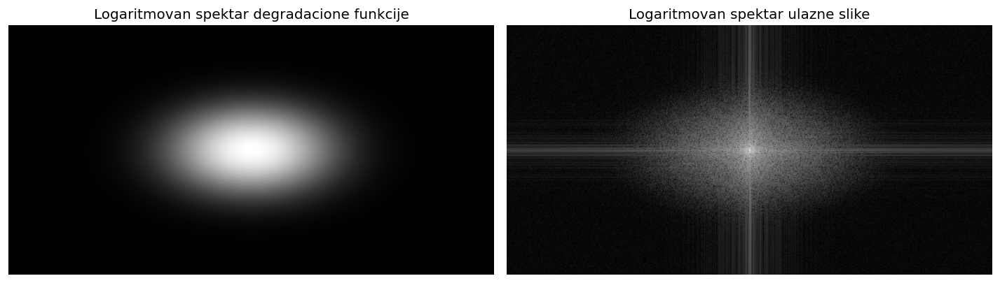

In [31]:
%matplotlib inline

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,12), dpi=120)
ax = axes.ravel()
ax[0].imshow(np.log(1+abs(H)), cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Logaritmovan spektar degradacione funkcije')
ax[1].imshow(np.log(1+abs(G)), cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Logaritmovan spektar ulazne slike')

plt.tight_layout()
plt.show()

In [32]:
f_est = np.zeros((M, N, 3))

for i in range(3):
    G_temp = fftshift(fft2(g[:, :, i]))
    F_est_temp = G_temp/H*H_lp_cut_off
    f_est_temp = np.real(ifft2(ifftshift(F_est_temp)))
    f_est_temp[f_est_temp<0] = 0
    f_est_temp[f_est_temp>1] = 1
    f_est[:,:,i] = f_est_temp

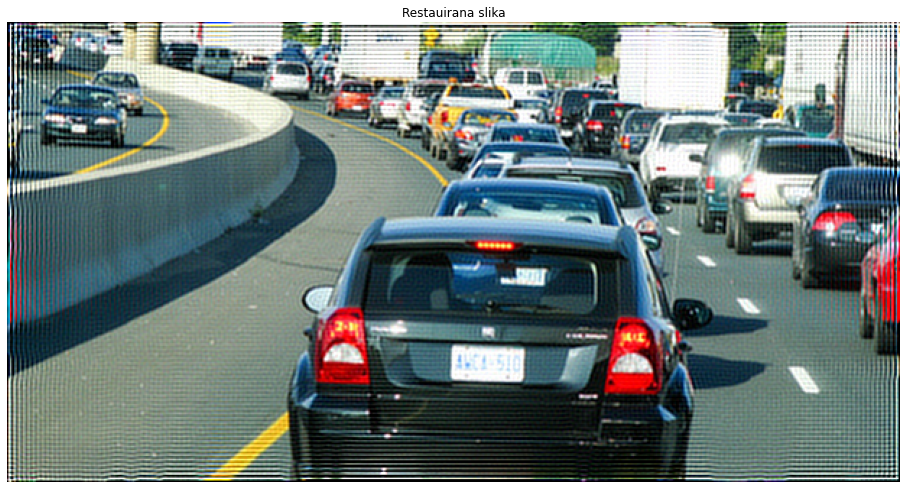

In [33]:
fig, ax = plt.subplots(figsize=(16,16))
ax.set_title('Restauirana slika')
plt.axis('off')
plt.imshow(f_est, vmin = 0, vmax = 1)
plt.show()

**Zaključak**: Na osnovu izlazne slike može se uočiti da su tablice AWCA-510. Na obodima slike možemo videti i distorzije koje su posledica primene oštrog odsecanja (idealnim filtrom) spektra na viskoki učestanostima, ali to ne predstavlja veliki problem jer je zadatak da se odrede tablice koje su u 'fokusu' slike.

# Zadatak 4

Funkcije koje će biti korišćene:

In [4]:
def gaussian(x_square, sigma):
    """
    Pomoćna funkcija koja vraća matricu gausovski raspodeljenih brojeva.
    
    Ulaz:
        - x_square: kvadrat rastojanja između dve tačke u ravni.
        - sigma: standardna devijacija
    """
    return np.exp(-0.5*x_square/sigma**2)

**Ideja za optimizovanu implementaciju prostornog filtriranja**: Filtriranje u prostornom domenu implementirano je uzimajući u obzir osobine simetričnosti i separabilnosti Gausove funkcije. Kako uzimamo prostorni Gausov filtar koji ima iste standardne devijacije po obe ose, on će biti i simetričan, pa je proces filtriranja (korelacija ulazne slike i filtra) jednak konvoluciji. Kako je konvolucija komutativna i asocijativna operacija, a naš filtar separabilan (može se zapisati u obliku proizvoda dve Gausove fukcije), možemo primeniti kaskadno filtriranje, odnosno konvoluciju prvo po jednoj,pa onda drugoj osi.

Separacija filtra:
$
 \omega_{x,y}(x,y,\sqrt{\sigma_{x}^{2} + \sigma_{y}^{2}}) = \frac{1}{ \sigma_{x}\sqrt{2 \pi}} *e^{(-\frac{{x}^{2}}{2\sigma_{x}^{2}})}\frac{1}{ \sigma_{y}\sqrt{2 \pi}} e^{(-\frac{{y}^{2}}{2\sigma_{y}^{2}})}  = \omega_{x}*\omega_{y}
$

Postupak filtriranja:
$
 g = \omega_{x,y}*f(x,y) = (\omega_{x}*\omega_{y})*f(x,y) = \omega_{x}*(\omega_{y}*f(x,y))
$

In [5]:
def filter_gauss(input_image, radius, sigma):
    """
    Funkcija koja pravi prostorni Gausov filtar i procuira filtriranje slike.
    
    Ulaz:
        - input_image: ulazna slika nad kojom vršimo filtriranje
        - radius: poluvisina prozora kvadratnog oblika, koji označava lokalno susedstvo piksela koji se trenutno
                  obrađuje
        - sigma: standardna devijacija Gausove funkcije po obe ose
    Izlaz:
    - filtrirana slika
    """
    # pravljenje prostornog filtra
    window_size = 2*radius + 1
    x = range(-radius, radius+1)
    X = np.matlib.repmat(x, window_size, 1)
    Y = X.transpose() 
    
    w_x = gaussian(X**2, sigma)
    w_x_norm = w_x/np.sum(w_x.flatten())
    # filtar je simetričan
    w_y_norm = np.transpose(w_x_norm) 

    # priprema slike za konvoluciju - proširivanje ivičnim pikselima
    input_image_paded = np.pad(input_image, ((radius, radius), (radius, radius)), 'edge')
    [M,N] = input_image.shape
    #inicijalizacija rezultata konvolucije po prvoj osi
    x_covolution = np.zeros([M,N+window_size-1])
    
    for i in range(M):
        temp = np.matmul(w_x_norm,input_image_paded[i:i+window_size, :])
        x_covolution[i,:] = np.sum(temp,axis = 0)
    # konvolucija po drugoj osi
    y_covolution = np.zeros([M,N])
    for i in range(N):
        temp = np.matmul(x_covolution[:,i:i+window_size], w_y_norm)
        y_covolution[:,i] = np.sum(temp,axis = 1)
    y_covolution[y_covolution<0] = 0
    y_covolution[y_covolution>1] = 1
    return y_covolution            

In [14]:
def filter_gauss_freq(input_image, radius, sigma):
    """
    Funkcija koja pravi prostorni Gausov filtar i procesuira filtriranje slike u frekvencijskom domenu. Konvolucija u
    vremenskom domenu odgovara množenju u frekvencijskom domenu, pa je filtriranje implementirano nad DFT ulazne slike
    i prostornog filtra. Kako bi se izbegla greška koja nastaje pri cirkularnoj konvoluciji sliku proširujemo kao u
    ogledalu, a filtar nulama, tako da budu istih dimenzija. Nakon toga radi se filtriranje u frekvencijskom domenu.
    Izlaznu sliku dobijamo kao inverznu DFT filtrirane slike.
    
    Ulazi:
        - input_image: ulazna slika nad kojom vršimo filtriranje
        - radius: poluvisina prozora kvadratnog oblika, koji označava lokalno susedstvo piksela koji se trenutno
                  obrađuje
        - sigma: sigma: standardna devijacija Gausove funkcije po obe ose
    
    Izlaz:
        - filtrirana slika
        
    """
    window_size = 2*radius+1
    
    [M,N] = input_image.shape
    
    # dimenzije proširene slike i filtra
    P = 2*M-1; Q=2*N-1 
    # proširivanje slike -reflektovanje kao u ogledalu
    input_image_paded = np.zeros([P,Q])
    input_image_transposed = np.transpose(input_image) 
    input_image_paded[0:M, 0:N] = input_image
    input_image_paded[0:M,N-1:] = np.transpose(input_image_transposed[::-1])  
    input_image_paded[M-1:,0:N] = input_image[::-1]
    input_image_paded[M-1:,N-1:] = input_image_paded[0:M,N-1:][::-1]
    
   # Definisanje lokalnog susedstva trenutnog piksela
    s = range(-radius, radius+1)
    S = np.matlib.repmat(s, window_size, 1)
    T = S.transpose() 
    
    # Pravljenje težinskih koeficijenata koji zavise od rastojanja od piksela koji se trenutno obrađuje
    gauss_mask = gaussian(S**2 + T**2, sigma)
    gauss_mask = gauss_mask/np.sum(gauss_mask.flatten())
    pixel_pad_num_y = N-1 - radius
    pixel_pad_num_x = M-1 - radius
    gauss_mask_paded = np.pad(array=gauss_mask,pad_width=((pixel_pad_num_x,pixel_pad_num_x),(pixel_pad_num_y,pixel_pad_num_y)),mode='constant',constant_values=((0, 0),(0,0))) 
    
    F = fftshift(fft2(input_image_paded))     
    H = fftshift(fft2(gauss_mask_paded)) 

    G = H*F
   
    g = np.real(ifft2(ifftshift(G)))
    g_out = g[M-1:,N-1:] 
    g_out = img_as_float(g_out)
    g_out[g_out<0] = 0
    g_out[g_out>1] = 1
    return g_out

Učitavanje i prikaz ulazne slike.

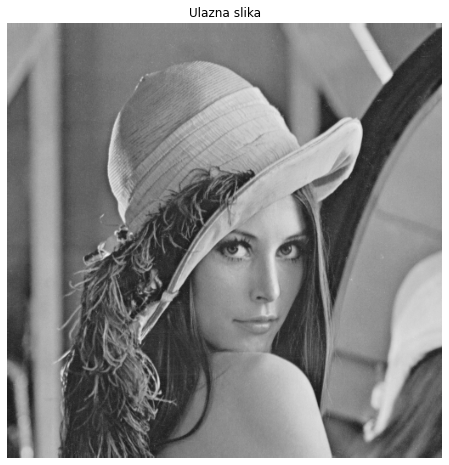

In [15]:
f = img_as_float(imageio.imread('.\sekvence\lena.tif'))

fig, ax = plt.subplots(figsize=(8,8))
ax.set_title('Ulazna slika')
plt.axis('off')
plt.imshow(f, vmin = 0, vmax = 1, cmap = 'gray')
plt.show()

In [16]:
num_of_r = 50
t_spatial = []
t_freq = []


for i in range(1,num_of_r+1):
    start = time.time()
    g_spatial = filter_gauss(f,i,i/3)  
    end = time.time()
    execution_time_s = end - start
    t_spatial.append(execution_time_s)
        
    
    start = time.time()
    g_freq = filter_gauss_freq(f,i,i/3)  
    end = time.time()
    execution_time_f = end - start
    t_freq.append(execution_time_f)


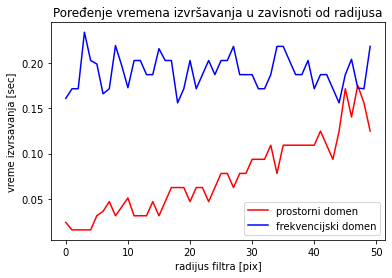

In [48]:
plt.plot(np.arange(50), t_spatial, 'r', label = 'prostorni domen')
plt.plot(np.arange(50), t_freq, 'b', label = 'frekvencijski domen')
plt.xlabel('radijus filtra [pix]')
plt.ylabel('vreme izvrsavanja [sec]')
plt.title('Poređenje vremena izvršavanja u zavisnoti od radijusa')
plt.legend()
plt.show()

**Zaključak**: Za sliku dimenzija NxN i filtar dimenzija KxK, pri filtriranju u prostornom domenu, kada iskoristimo osobine simetričnosti i separabilnosti postižemo složenost $\mathcal{O}(2KN^{2})$, odnosno linearnu složenost u zavisnosti od radijusa filtra. Kada ove osobine ne bi bile iskorišćene dobili bismo kompleksnost $\mathcal{O}(2K^{2}N^{2})$, tako da dobijemo značajno pobiljšanje, međutim ukoliko nam iz nekog razloga dosta ograničena memorija mogli bismo da uzmemo u obzir drugu mogućnost jer ne zahteva čuvanje međurezultata.
Pri filtriranju u frekvencijskom domenu, kao što vidimo sa dobijenog grafika poređenja vremena izvršavanja u zavisnoti od radijusa, kompleksnost ne zavisi od veličine filtra, odnosno dominantan član je $\mathcal{O}(N^{2})$. Kako filtriranje u prostornom domenu ima linearni trend rasta posle neke veće vrednosti radijusa bi moglo da se uoči da vreme izvršavanja filtriranja u prostornom domenu nadmašuje ono u frekvencijskom. Možemo zaključiti da je za manje filtre koji imaju osobinu simetričnosti i separabilnosti bolje raditi filtriranje u prostornom domenu, jer ne moramo da vršimo prebacivanje slike u frekvencijski domen.

In [49]:
t_spatial.clear()
t_freq.clear()

In [50]:
radius = 5
sigma = radius/3

lena_spatial = filter_gauss(f, radius, sigma)
lena_freq = filter_gauss_freq(f, radius, sigma)
diff = abs(lena_spatial - lena_freq)

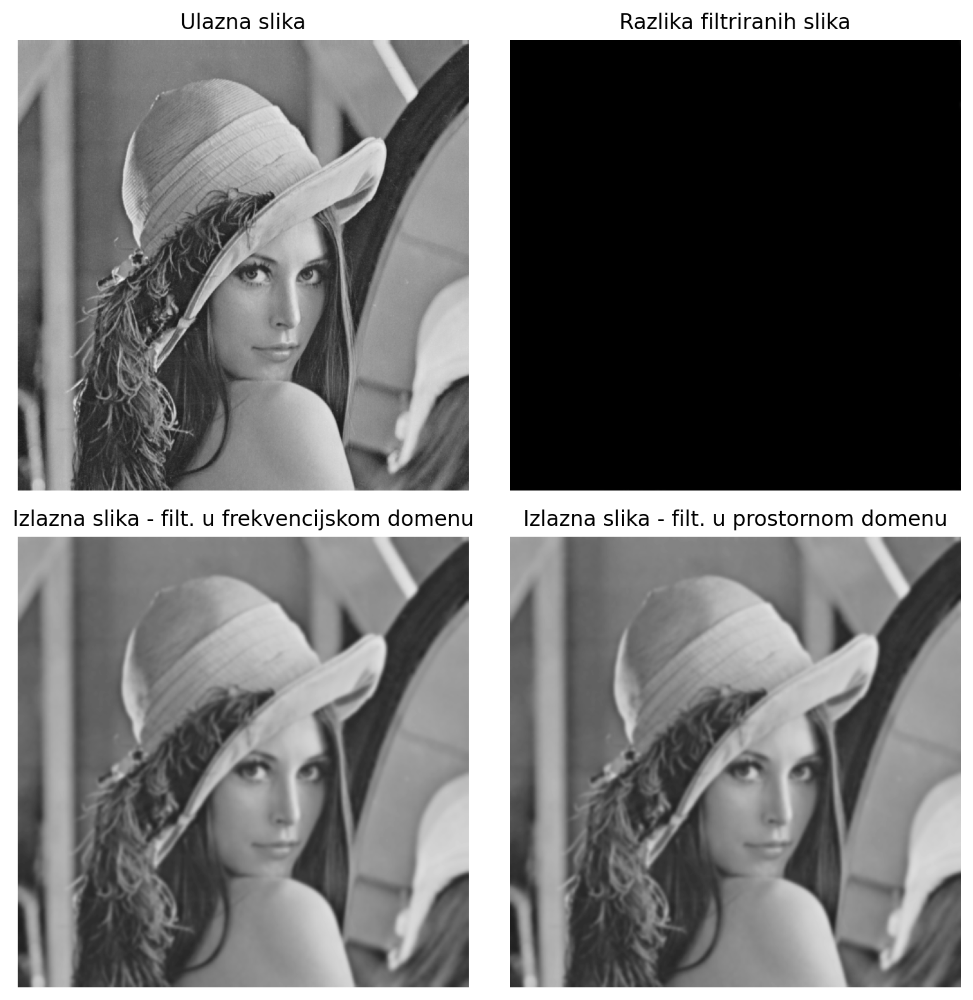

In [51]:
fig,axes = plt.subplots(nrows=2, ncols=2, figsize=(8,8), dpi=200) 
ax = axes.ravel()

ax[0].imshow(f, vmin = 0, vmax = 1, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(diff, vmin = 0, vmax = 1, cmap='gray'); ax[1].set_axis_off(); 
ax[1].set_title('Razlika filtriranih slika')
ax[2].imshow(lena_freq, vmin = 0, vmax = 1, cmap='gray'); ax[2].set_axis_off(); 
ax[2].set_title('Izlazna slika - filt. u frekvencijskom domenu')
ax[3].imshow(lena_spatial, vmin = 0, vmax = 1, cmap='gray'); 
ax[3].set_axis_off(); ax[3].set_title('Izlazna slika - filt. u prostornom domenu')

plt.tight_layout()
plt.show()

Rezultati filtriranja u prostornom i vremenskom domenu su na oko idenstični, međutim, za veće vrednosti radijusa(>30) se može naći da greška nije zanemarljiva u smislu da prelazi očekivano odstupanje zbog greški zaokruživanja (koje su obično reda 10^(-16)).